# Red Wine Quality Prediction

Problem Statement

The dataset is related to red and white variants of the Portuguese 
"Vinho Verde" wine. Due to privacy and logistic issues, only physicochemical 
(inputs) and sensory (the output) variables are available (e.g. there is no 
data about grape types, wine brand, wine selling price, etc.).

This dataset can be viewed as classification task. The classes are 
ordered and not balanced (e.g. there are many more normal wines than excellent 
or poor ones). Also, we are not sure if all input variables are relevant. So 
it could be interesting to test feature selection methods.

Attribute Information

Input variables (based on physicochemical tests):
1 - fixed acidity
2 - volatile acidity
3 - citric acid
4 - residual sugar
5 - chlorides
6 - free sulfur dioxide
7 - total sulfur dioxide
8 - density
9 - pH
10 - sulphates
11 - alcohol
Output variable (based on sensory data):
12 - quality (score between 0 and 10)

What might be an interesting thing to do, is to set an arbitrary cutoff for 
your dependent variable (wine quality) at e.g. 7 or higher getting classified 
as 'good/1' and the remainder as 'not good/0'.
This allows you to practice with hyper parameter tuning on e.g. decision tree 
algorithms looking at the ROC curve and the AUC value.

You need to build a classification model. 

Inspiration

Use machine learning to determine which physiochemical properties make a wine 
'good'!

# Importing required Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import warnings 
warnings.filterwarnings('ignore')

# Loading the Dataset

In [2]:
df=pd.read_csv('redwine.csv')

In [3]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [4]:
df.sample()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
909,7.3,0.305,0.39,1.2,0.059,7.0,11.0,0.99331,3.29,0.52,11.5,6


In [5]:
df.sample(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1211,6.6,0.44,0.15,2.1,0.076,22.0,53.0,0.99570,3.32,0.62,9.3,5
1095,9.4,0.40,0.47,2.5,0.087,6.0,20.0,0.99772,3.15,0.50,10.5,5
1552,6.3,0.68,0.01,3.7,0.103,32.0,54.0,0.99586,3.51,0.66,11.3,6
500,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.99840,3.43,0.65,9.0,6
1418,7.8,0.53,0.01,1.6,0.077,3.0,19.0,0.99500,3.16,0.46,9.8,5


sample function shows the random 5 rows

In [6]:
df.shape

(1599, 12)

So we have a dataset which contains 1599 rows and 12 columns

Lets see the summary of this dataset 

In [7]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


 There are huge difference between the 1st quartile and 3rd quartile, but less difference in 1st and 2nd quartile

There is a huge difference between the 3rd quartile and maximum rows therefore 
outliers are presented.

In [8]:
pd.set_option('display.max_rows',None)

In [9]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.400000,5
1,7.8,0.880,0.00,2.60,0.098,25.0,67.0,0.99680,3.20,0.68,9.800000,5
2,7.8,0.760,0.04,2.30,0.092,15.0,54.0,0.99700,3.26,0.65,9.800000,5
3,11.2,0.280,0.56,1.90,0.075,17.0,60.0,0.99800,3.16,0.58,9.800000,6
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.400000,5
5,7.4,0.660,0.00,1.80,0.075,13.0,40.0,0.99780,3.51,0.56,9.400000,5
6,7.9,0.600,0.06,1.60,0.069,15.0,59.0,0.99640,3.30,0.46,9.400000,5
7,7.3,0.650,0.00,1.20,0.065,15.0,21.0,0.99460,3.39,0.47,10.000000,7
8,7.8,0.580,0.02,2.00,0.073,9.0,18.0,0.99680,3.36,0.57,9.500000,7
9,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.500000,5


Check for outliers and skewness present in further steps

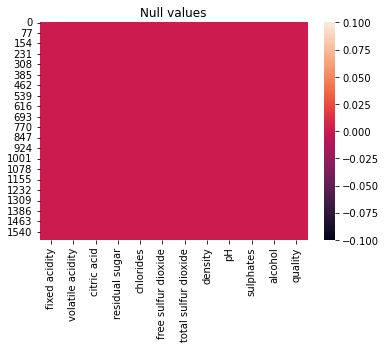

In [10]:
sns.heatmap(df.isnull())
plt.title("Null values")
plt.show()

In [11]:
# Checking for null values in Dataset

In [12]:
df.isnull().sum().sum()

0

Therefore there is no null values present inside the dataset

# Target Variable

If we see the target varible which contains values between 0 and 1 and we need 
to set an arbitrary cut off as per the requirement

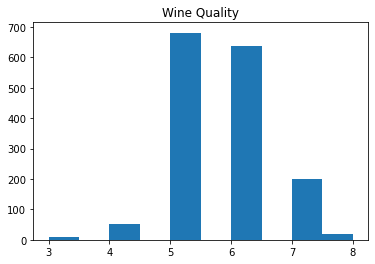

In [13]:
df['quality'].hist(grid=False)
plt.title('Wine Quality')
plt.show()

Histplot clearly depicts the 5 and 6 quality holds the most number of rows

In [14]:
df['quality'].value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

In [15]:
df.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.256131,0.671703,0.114777,0.093705,-0.153794,-0.113181,0.668047,-0.682978,0.183006,-0.061668,0.124052
volatile acidity,-0.256131,1.000000,-0.552496,0.001918,0.061298,-0.010504,0.076470,0.022026,0.234937,-0.260987,-0.202288,-0.390558
citric acid,0.671703,-0.552496,1.000000,0.143577,0.203823,-0.060978,0.035533,0.364947,-0.541904,0.312770,0.109903,0.226373
residual sugar,0.114777,0.001918,0.143577,1.000000,0.055610,0.187049,0.203028,0.355283,-0.085652,0.005527,0.042075,0.013732
chlorides,0.093705,0.061298,0.203823,0.055610,1.000000,0.005562,0.047400,0.200632,-0.265026,0.371260,-0.221141,-0.128907
free sulfur dioxide,-0.153794,-0.010504,-0.060978,0.187049,0.005562,1.000000,0.667666,-0.021946,0.070377,0.051658,-0.069408,-0.050656
total sulfur dioxide,-0.113181,0.076470,0.035533,0.203028,0.047400,0.667666,1.000000,0.071269,-0.066495,0.042947,-0.205654,-0.185100
density,0.668047,0.022026,0.364947,0.355283,0.200632,-0.021946,0.071269,1.000000,-0.341699,0.148506,-0.496180,-0.174919
pH,-0.682978,0.234937,-0.541904,-0.085652,-0.265026,0.070377,-0.066495,-0.341699,1.000000,-0.196648,0.205633,-0.057731
sulphates,0.183006,-0.260987,0.312770,0.005527,0.371260,0.051658,0.042947,0.148506,-0.196648,1.000000,0.093595,0.251397


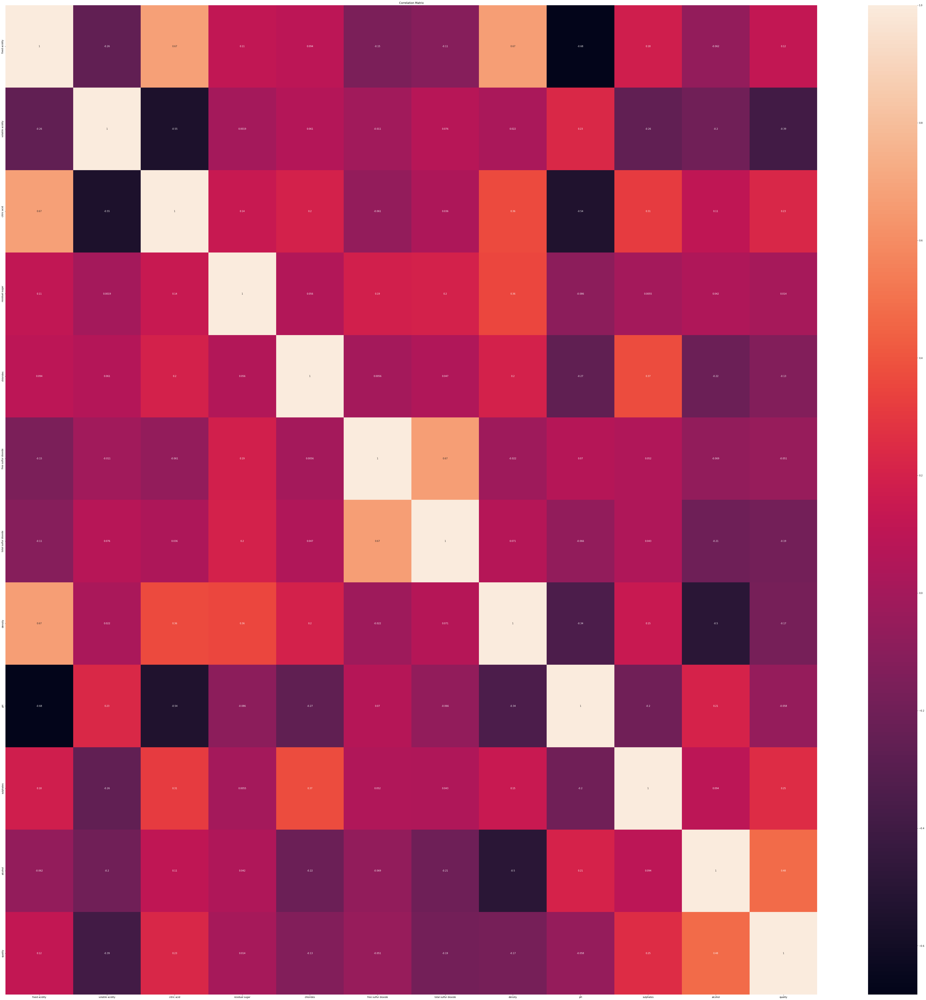

In [16]:
corr_mat=df.corr()
# size of the canvas
plt.figure(figsize=[80,80])
#plot the correlation matrix
sns.heatmap(corr_mat,annot=True)
plt.title("Correlation Matrix")
plt.savefig('redwine correlation_matrix.jpg')
plt.show()

In [17]:
corr_matrix=df.corr()
corr_matrix

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.256131,0.671703,0.114777,0.093705,-0.153794,-0.113181,0.668047,-0.682978,0.183006,-0.061668,0.124052
volatile acidity,-0.256131,1.000000,-0.552496,0.001918,0.061298,-0.010504,0.076470,0.022026,0.234937,-0.260987,-0.202288,-0.390558
citric acid,0.671703,-0.552496,1.000000,0.143577,0.203823,-0.060978,0.035533,0.364947,-0.541904,0.312770,0.109903,0.226373
residual sugar,0.114777,0.001918,0.143577,1.000000,0.055610,0.187049,0.203028,0.355283,-0.085652,0.005527,0.042075,0.013732
chlorides,0.093705,0.061298,0.203823,0.055610,1.000000,0.005562,0.047400,0.200632,-0.265026,0.371260,-0.221141,-0.128907
free sulfur dioxide,-0.153794,-0.010504,-0.060978,0.187049,0.005562,1.000000,0.667666,-0.021946,0.070377,0.051658,-0.069408,-0.050656
total sulfur dioxide,-0.113181,0.076470,0.035533,0.203028,0.047400,0.667666,1.000000,0.071269,-0.066495,0.042947,-0.205654,-0.185100
density,0.668047,0.022026,0.364947,0.355283,0.200632,-0.021946,0.071269,1.000000,-0.341699,0.148506,-0.496180,-0.174919
pH,-0.682978,0.234937,-0.541904,-0.085652,-0.265026,0.070377,-0.066495,-0.341699,1.000000,-0.196648,0.205633,-0.057731
sulphates,0.183006,-0.260987,0.312770,0.005527,0.371260,0.051658,0.042947,0.148506,-0.196648,1.000000,0.093595,0.251397


In [18]:
type(corr_matrix)

pandas.core.frame.DataFrame

In [19]:
corr_matrix=df.corr()
corr_matrix['quality'].sort_values(ascending=False)

quality                 1.000000
alcohol                 0.476166
sulphates               0.251397
citric acid             0.226373
fixed acidity           0.124052
residual sugar          0.013732
free sulfur dioxide    -0.050656
pH                     -0.057731
chlorides              -0.128907
density                -0.174919
total sulfur dioxide   -0.185100
volatile acidity       -0.390558
Name: quality, dtype: float64

Now we can clearly get the correlation of independent variable with target 
variable "Class"

Let's check the data distribution among all the columns

In [20]:
df.describe(include='all')

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [22]:
df.skew()

fixed acidity           0.982751
volatile acidity        0.671593
citric acid             0.318337
residual sugar          4.540655
chlorides               5.680347
free sulfur dioxide     1.250567
total sulfur dioxide    1.515531
density                 0.071288
pH                      0.193683
sulphates               2.428672
alcohol                 0.860829
quality                 0.217802
dtype: float64

<AxesSubplot:>

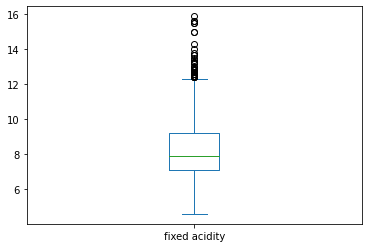

In [23]:
df['fixed acidity'].plot.box()

<AxesSubplot:>

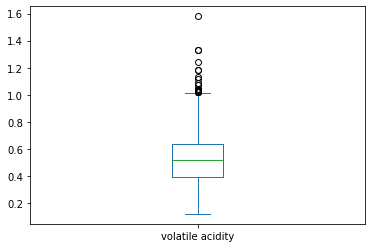

In [24]:
df['volatile acidity'].plot.box()

<AxesSubplot:>

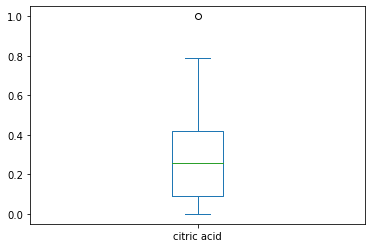

In [25]:
df['citric acid'].plot.box()

<AxesSubplot:>

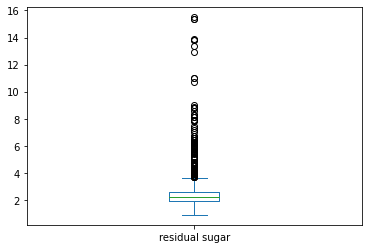

In [26]:
df['residual sugar'].plot.box()

<AxesSubplot:>

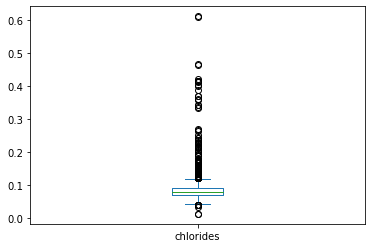

In [27]:
df['chlorides'].plot.box()

<AxesSubplot:>

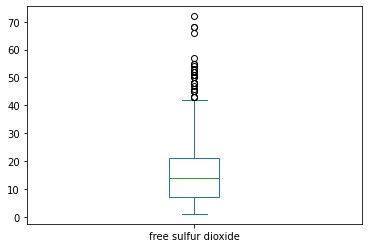

In [28]:
df['free sulfur dioxide'].plot.box()

<AxesSubplot:>

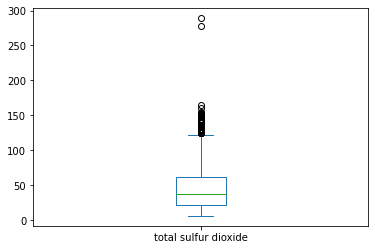

In [29]:
df['total sulfur dioxide'].plot.box()

<AxesSubplot:>

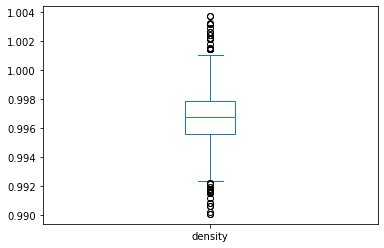

In [30]:
df['density'].plot.box()

<AxesSubplot:>

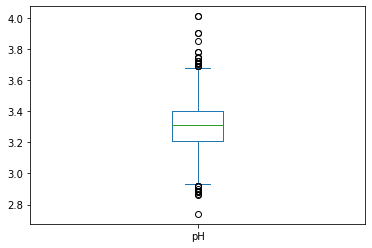

In [31]:
df['pH'].plot.box()

<AxesSubplot:>

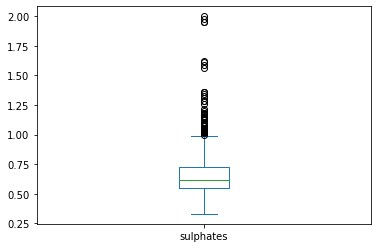

In [32]:
df['sulphates'].plot.box()

<AxesSubplot:>

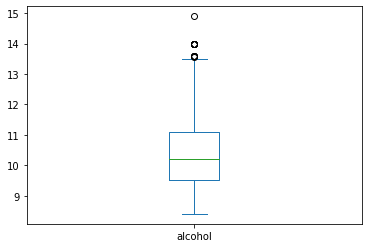

In [33]:
df['alcohol'].plot.box()

<AxesSubplot:>

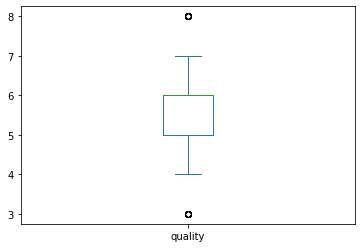

In [34]:
df['quality'].plot.box()

# Visualizing the data

(0.0, 16.465)

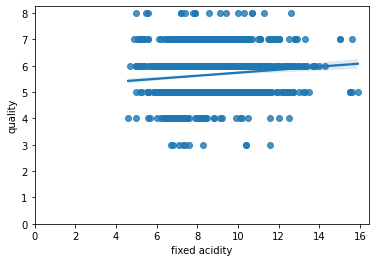

In [35]:
sns.regplot(x='fixed acidity',y='quality',data=df)
plt.ylim(0,)
plt.xlim(0,)

Here, if fixed acidity increases quality also increases.Therefore volatile
acidity
is inversely proportional to quality = Positive linear relationship.

(0.0, 1.653)

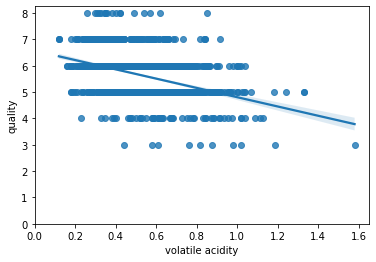

In [36]:
sns.regplot(x='volatile acidity',y='quality',data=df)
plt.ylim(0,)
plt.xlim(0,)

Here, if volatile acidity increases quality decreases.Therefore volatile acidity
is inversely proportional to quality = Negative linear relationship

(0.01, 1.05)

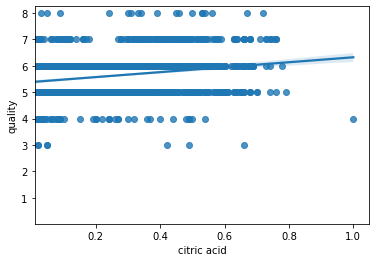

In [37]:
sns.regplot(x='citric acid',y='quality',data=df)
plt.ylim(0.01,)
plt.xlim(0.01,)

Here, if citric acid increases quality increases.Therefore citric acid is 
directly proportional to quality = positive linear relationship

(1.0, 16.23)

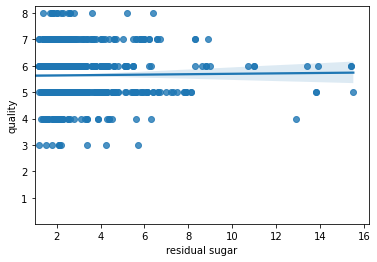

In [38]:
sns.regplot(x='residual sugar',y='quality',data=df)
plt.ylim(0.01,)
plt.xlim(1,)

(0.001, 0.64095)

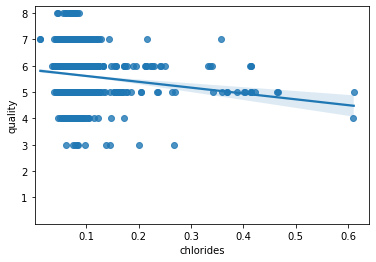

In [39]:
sns.regplot(x='chlorides',y='quality',data=df)
plt.ylim(0.0001,)
plt.xlim(0.001,)

Here it shows Negative linear relationship

(0.01, 75.55)

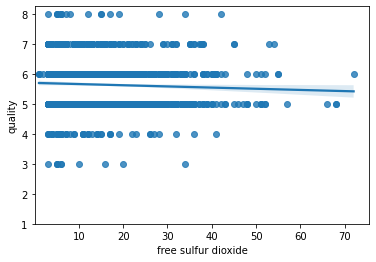

In [40]:
sns.regplot(x='free sulfur dioxide',y='quality',data=df)
plt.ylim(1,)
plt.xlim(0.01,)

Here free sulphur dioxide shows = Negative Linear Relationship

(1.0, 303.15)

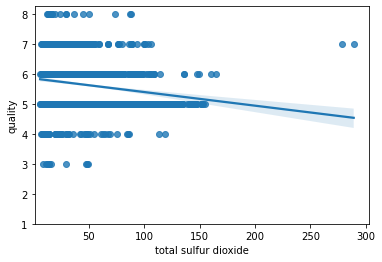

In [41]:
sns.regplot(x='total sulfur dioxide',y='quality',data=df)
plt.ylim(1,)
plt.xlim(1,)

Here total sulphur dioxide shows = Negative linear relationship

(1.0, 1.004371)

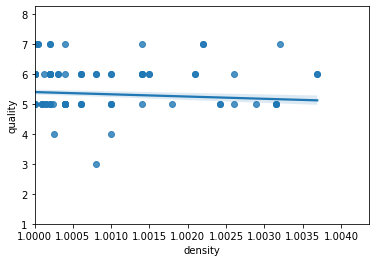

In [42]:
sns.regplot(x='density',y='quality',data=df)
plt.ylim(1,)
plt.xlim(1,)

Here, density shows = Negative linear relationship

(1.0, 4.0735)

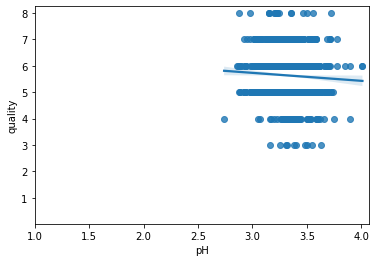

In [43]:
sns.regplot(x='pH',y='quality',data=df)
plt.ylim(0.01,)
plt.xlim(1,)

Here, pH shows = Negative linear relationship

(0.01, 2.0835)

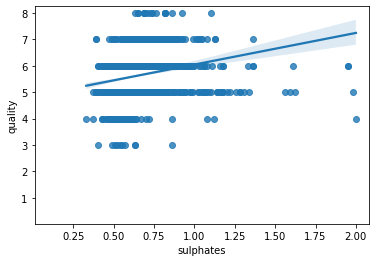

In [44]:
sns.regplot(x='sulphates',y='quality',data=df)
plt.ylim(0.01,)
plt.xlim(0.01,)

Here, sulphates shows = Positive linear relationship

(6.0, 15.225)

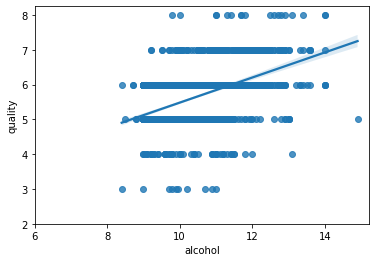

In [45]:
sns.regplot(x='alcohol',y='quality',data=df)
plt.ylim(2,)
plt.xlim(6,)

From Regression plot we can come to the conclusion that Fixed acidity,Citric 
acid,Sulphates,Alcohol gives the positive linear relationship

Scatter plots

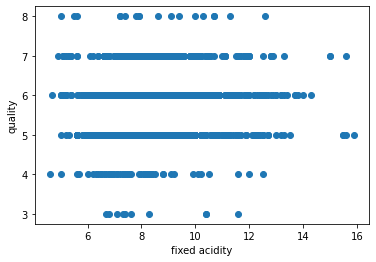

In [46]:
plt.scatter(df['fixed acidity'],df['quality'])
plt.xlabel('fixed acidity')
plt.ylabel('quality')
plt.show()

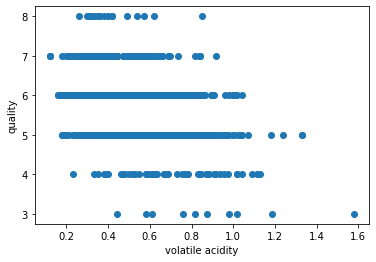

In [47]:
plt.scatter(df['volatile acidity'],df['quality'])
plt.xlabel('volatile acidity')
plt.ylabel('quality')
plt.show()

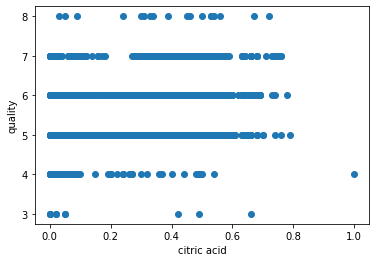

In [48]:
plt.scatter(df['citric acid'],df['quality'])
plt.xlabel('citric acid')
plt.ylabel('quality')
plt.show()

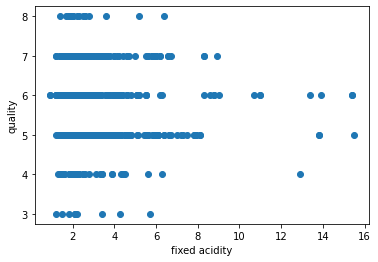

In [50]:
plt.scatter(df['residual sugar'],df['quality'])
plt.xlabel('fixed acidity')
plt.ylabel('quality')
plt.show()

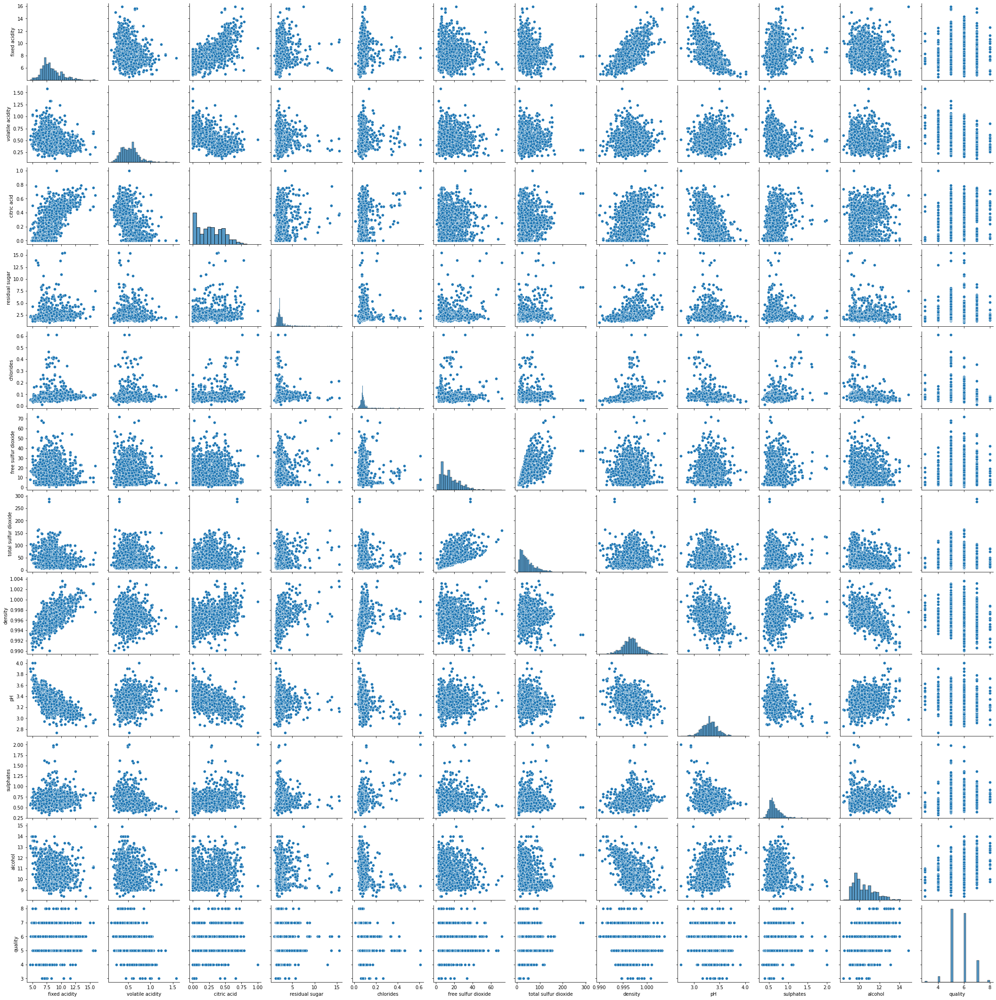

In [51]:
sns.pairplot(df)

Splitting the Independent and Target variable in x and y before removing the 
skewness

To set an Arbitrary cut off for the dependent variable and convert it into an 
categorical variable so we can do classification model. Once it is done then we can go for splitting the datas for model 

In [52]:
df['good quality'] = [1 if x>7 else 0 for x in df['quality']]
# Seperate feature variables and target variable
x=df.drop(['quality','good quality'],axis=1)
y=df['good quality']

In [53]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.400000
1,7.8,0.880,0.00,2.60,0.098,25.0,67.0,0.99680,3.20,0.68,9.800000
2,7.8,0.760,0.04,2.30,0.092,15.0,54.0,0.99700,3.26,0.65,9.800000
3,11.2,0.280,0.56,1.90,0.075,17.0,60.0,0.99800,3.16,0.58,9.800000
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.400000
5,7.4,0.660,0.00,1.80,0.075,13.0,40.0,0.99780,3.51,0.56,9.400000
6,7.9,0.600,0.06,1.60,0.069,15.0,59.0,0.99640,3.30,0.46,9.400000
7,7.3,0.650,0.00,1.20,0.065,15.0,21.0,0.99460,3.39,0.47,10.000000
8,7.8,0.580,0.02,2.00,0.073,9.0,18.0,0.99680,3.36,0.57,9.500000
9,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.500000


In [54]:
y

0       0
1       0
2       0
3       0
4       0
5       0
6       0
7       0
8       0
9       0
10      0
11      0
12      0
13      0
14      0
15      0
16      0
17      0
18      0
19      0
20      0
21      0
22      0
23      0
24      0
25      0
26      0
27      0
28      0
29      0
30      0
31      0
32      0
33      0
34      0
35      0
36      0
37      0
38      0
39      0
40      0
41      0
42      0
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      0
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      0
70      0
71      0
72      0
73      0
74      0
75      0
76      0
77      0
78      0
79      0
80      0
81      0
82      0
83      0
84      0
85      0
86      0
87      0
88      0
89      0
90      0
91      0
92      0
93      0
94      0
95      0
96      0
97      0
98      0
99      0


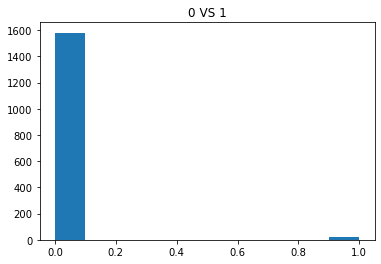

In [55]:
df['good quality'].hist(grid=False)
plt.title("0 VS 1")
plt.show()

In [56]:
df['good quality'].value_counts()

0    1581
1      18
Name: good quality, dtype: int64

In [57]:
# Checking Skewness

In [58]:
x.skew().sort_values(ascending=False)

chlorides               5.680347
residual sugar          4.540655
sulphates               2.428672
total sulfur dioxide    1.515531
free sulfur dioxide     1.250567
fixed acidity           0.982751
alcohol                 0.860829
volatile acidity        0.671593
citric acid             0.318337
pH                      0.193683
density                 0.071288
dtype: float64

We can skewness in most of our columns of our dataset, we will remove the 
skewness using power_transform function

In [59]:
import sklearn

In [60]:
from sklearn.preprocessing import power_transform
x_new=power_transform(x)

In [61]:
# checking skewness
pd.DataFrame(x_new).skew().sort_values(ascending=False)

10    0.112372
2     0.017788
9     0.009985
1     0.003099
0     0.002529
8    -0.002823
6    -0.003752
7    -0.005054
5    -0.009948
3    -0.015715
4    -0.151304
dtype: float64

In [62]:
type(x_new)

numpy.ndarray

In [63]:
x.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

In [64]:
x=pd.DataFrame(x_new,columns=x.columns)

In [65]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,-0.442666,0.995542,-1.531109,-0.597145,-0.172896,-0.268045,-0.124411,0.564442,1.275690,-0.581650,-1.075025
1,-0.161308,1.771299,-1.531109,0.556565,0.786204,0.993852,0.854954,0.036967,-0.709517,0.395140,-0.500860
2,-0.161308,1.269801,-1.255359,0.152372,0.560696,0.193450,0.540394,0.142851,-0.310054,0.183772,-0.500860
3,1.522582,-1.550050,1.398471,-0.597145,-0.226113,0.385115,0.693699,0.669354,-0.980154,-0.392318,-0.500860
4,-0.442666,0.995542,-1.531109,-0.597145,-0.172896,-0.268045,-0.124411,0.564442,1.275690,-0.581650,-1.075025
5,-0.442666,0.802929,-1.531109,-0.837193,-0.226113,-0.021924,0.107498,0.564442,1.275690,-0.581650,-1.075025
6,-0.094677,0.497996,-1.122699,-1.404288,-0.566402,0.193450,0.669200,-0.175390,-0.047962,-1.739501,-1.075025
7,-0.516971,0.753478,-1.531109,-3.045490,-0.814706,0.193450,-0.799912,-1.140757,0.529832,-1.605418,-0.249498
8,-0.161308,0.391782,-1.391443,-0.380998,-0.335468,-0.555712,-1.011651,0.036967,0.339033,-0.485467,-0.921731
9,-0.370000,-0.058175,0.539338,2.116898,-0.448846,0.385115,1.475168,0.564442,0.275038,1.076325,0.292864


Validating that skewness has been removed or not

In [66]:
x.skew().sort_values(ascending=False)

alcohol                 0.112372
citric acid             0.017788
sulphates               0.009985
volatile acidity        0.003099
fixed acidity           0.002529
pH                     -0.002823
total sulfur dioxide   -0.003752
density                -0.005054
free sulfur dioxide    -0.009948
residual sugar         -0.015715
chlorides              -0.151304
dtype: float64

In [67]:
sk=x.skew()
sk

fixed acidity           0.002529
volatile acidity        0.003099
citric acid             0.017788
residual sugar         -0.015715
chlorides              -0.151304
free sulfur dioxide    -0.009948
total sulfur dioxide   -0.003752
density                -0.005054
pH                     -0.002823
sulphates               0.009985
alcohol                 0.112372
dtype: float64

In [68]:
sk[np.abs(sk)>0.5].all()

True

In [69]:
sk[np.abs(sk)>0.5]

Series([], dtype: float64)

In [70]:
x.skew()[np.abs(x.skew())<0.25].all()

True

Skewness has been removed now we can proceed with further steps

# Checking Outliers

In [71]:
# plotting box plot for first 6 columns

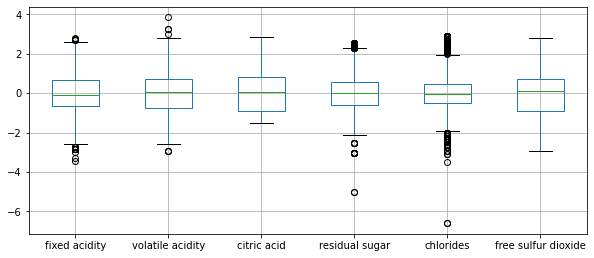

In [72]:
x.iloc[:,0:6].boxplot(figsize=[10,5])
plt.subplots_adjust(bottom=0.25)
plt.show()

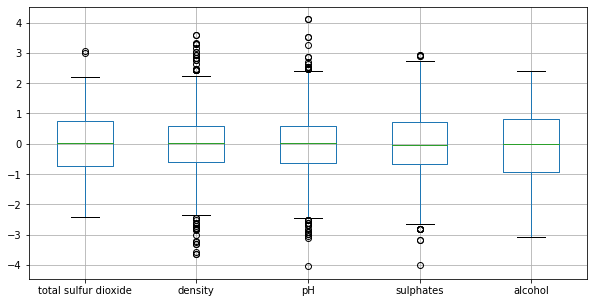

In [73]:
# Plotting for rest of all the columns
x.iloc[:,6:12].boxplot(figsize=[10,6])
plt.subplots_adjust(bottom=0.25)
plt.show()

Lets Quantify

In [74]:
from scipy.stats import zscore
(np.abs(zscore(x))<3).all()

fixed acidity           False
volatile acidity        False
citric acid              True
residual sugar          False
chlorides               False
free sulfur dioxide      True
total sulfur dioxide    False
density                 False
pH                      False
sulphates               False
alcohol                 False
dtype: bool

Therefore we have a lot of outliers.We can remove the outliers using
Z-score Technique.

# Removing Outliers = z-score technique

fixed acidity

In [76]:
print("Highest allowed",df['fixed acidity'].mean()+3*df['fixed acidity'].std())
print("Lowest allowed",df['fixed acidity'].mean()-3*df['fixed acidity'].std())

Highest allowed 13.54292622767894
Lowest allowed 3.096348318912736


Finding the Outliers

In [82]:
df[(df['fixed acidity']>13.54) | (df['fixed acidity']<3.09)]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,good quality
243,13.542926,0.210,0.44,2.2,0.075,10.0,24.0,1.00005,3.07,0.84,9.2,7,0
244,13.542926,0.210,0.44,2.2,0.075,10.0,24.0,1.00005,3.07,0.84,9.2,7,0
347,13.542926,0.490,0.67,3.0,0.093,6.0,15.0,0.99860,3.02,0.93,12.0,6,0
374,13.542926,0.410,0.63,3.8,0.089,6.0,47.0,1.00140,3.01,0.81,10.8,6,0
381,13.542926,0.415,0.68,2.9,0.085,17.0,43.0,1.00140,3.06,0.80,10.0,6,0
391,13.542926,0.415,0.68,2.9,0.085,17.0,43.0,1.00140,3.06,0.80,10.0,6,0
442,13.542926,0.685,0.76,3.7,0.100,6.0,43.0,1.00320,2.95,0.68,11.2,7,0
544,13.542926,0.310,0.74,1.8,0.075,6.0,15.0,1.00080,2.86,0.79,8.4,6,0
554,13.542926,0.645,0.49,4.2,0.095,10.0,23.0,1.00315,2.92,0.74,11.1,5,0
555,13.542926,0.645,0.49,4.2,0.095,10.0,23.0,1.00315,2.92,0.74,11.1,5,0


Triming of outliers

In [83]:
new_df=df[(df['fixed acidity']<13.54)&(df['fixed acidity']>3.09)]
new_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,good quality
0,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.400000,5,0
1,7.8,0.880,0.00,2.60,0.098,25.0,67.0,0.99680,3.20,0.68,9.800000,5,0
2,7.8,0.760,0.04,2.30,0.092,15.0,54.0,0.99700,3.26,0.65,9.800000,5,0
3,11.2,0.280,0.56,1.90,0.075,17.0,60.0,0.99800,3.16,0.58,9.800000,6,0
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.400000,5,0
5,7.4,0.660,0.00,1.80,0.075,13.0,40.0,0.99780,3.51,0.56,9.400000,5,0
6,7.9,0.600,0.06,1.60,0.069,15.0,59.0,0.99640,3.30,0.46,9.400000,5,0
7,7.3,0.650,0.00,1.20,0.065,15.0,21.0,0.99460,3.39,0.47,10.000000,7,0
8,7.8,0.580,0.02,2.00,0.073,9.0,18.0,0.99680,3.36,0.57,9.500000,7,0
9,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.500000,5,0


Capping on outliers

In [84]:
upper_limit=df['fixed acidity'].mean()+3*df['fixed acidity'].std()
lower_limit=df['fixed acidity'].mean()-3*df['fixed acidity'].std()

In [85]:
df['fixed acidity'] = np.where(
    df['fixed acidity']>upper_limit,
    upper_limit,
    np.where(
        df['fixed acidity']<lower_limit,
        lower_limit,
        df['fixed acidity']
    )
)

In [87]:
df['fixed acidity'].describe()

count    1599.000000
mean        8.309337
std         1.704978
min         4.600000
25%         7.100000
50%         7.900000
75%         9.200000
max        13.433030
Name: fixed acidity, dtype: float64

Volatile acidity

In [88]:
print('Highest allowed',df['volatile acidity'].mean()+3*df['volatile acidity'].std())
print('Lowest allowed',df['volatile acidity'].mean()-3*df['volatile acidity'].std())

Highest allowed 1.064999625281118
Lowest allowed -0.00935859964009178


In [89]:
df[(df['volatile acidity']>1.0645) | (df['volatile acidity']<-0.00935)]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,good quality
38,5.7,1.130,0.09,1.50,0.172,7.0,19.0,0.99400,3.50,0.48,9.8,4,0
120,7.3,1.070,0.09,1.70,0.178,10.0,89.0,0.99620,3.30,0.57,9.0,5,0
126,8.2,1.330,0.00,1.70,0.081,3.0,12.0,0.99640,3.53,0.49,10.9,5,0
127,8.1,1.330,0.00,1.80,0.082,3.0,12.0,0.99640,3.54,0.48,10.9,5,0
199,6.9,1.090,0.06,2.10,0.061,12.0,31.0,0.99480,3.51,0.43,11.4,4,0
672,9.8,1.240,0.34,2.00,0.079,32.0,151.0,0.99800,3.15,0.53,9.5,5,0
690,7.4,1.185,0.00,4.25,0.097,5.0,14.0,0.99660,3.63,0.54,10.7,3,0
724,7.5,1.115,0.10,3.10,0.086,5.0,12.0,0.99580,3.54,0.60,11.2,4,0
1299,7.6,1.580,0.00,2.10,0.137,5.0,9.0,0.99476,3.50,0.40,10.9,3,0
1312,8.0,1.180,0.21,1.90,0.083,14.0,41.0,0.99532,3.34,0.47,10.5,5,0


In [90]:
new_df=df[(df['volatile acidity']<1.0645)&(df['volatile acidity']>0.00935)]
new_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,good quality
0,7.40000,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.400000,5,0
1,7.80000,0.880,0.00,2.60,0.098,25.0,67.0,0.99680,3.20,0.68,9.800000,5,0
2,7.80000,0.760,0.04,2.30,0.092,15.0,54.0,0.99700,3.26,0.65,9.800000,5,0
3,11.20000,0.280,0.56,1.90,0.075,17.0,60.0,0.99800,3.16,0.58,9.800000,6,0
4,7.40000,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.400000,5,0
5,7.40000,0.660,0.00,1.80,0.075,13.0,40.0,0.99780,3.51,0.56,9.400000,5,0
6,7.90000,0.600,0.06,1.60,0.069,15.0,59.0,0.99640,3.30,0.46,9.400000,5,0
7,7.30000,0.650,0.00,1.20,0.065,15.0,21.0,0.99460,3.39,0.47,10.000000,7,0
8,7.80000,0.580,0.02,2.00,0.073,9.0,18.0,0.99680,3.36,0.57,9.500000,7,0
9,7.50000,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.500000,5,0


In [91]:
upper_limit=df['volatile acidity'].mean()+3*df['volatile acidity'].std()
lower_limit=df['volatile acidity'].mean()-3*df['volatile acidity'].std()

In [92]:
df['volatile acidity'] = np.where(
    df['volatile acidity']>upper_limit,
    upper_limit,
    np.where(
        df['volatile acidity']<lower_limit,
        lower_limit,
        df['volatile acidity']
    )
)

In [93]:
df['volatile acidity'].describe()

count    1599.000000
mean        0.526820
std         0.175188
min         0.120000
25%         0.390000
50%         0.520000
75%         0.640000
max         1.065000
Name: volatile acidity, dtype: float64

Residual sugar

In [95]:
print('Highest allowed',df['residual sugar'].mean()+3*df['residual sugar'].std())
print('Lowest allowed',df['residual sugar'].mean()-3*df['residual sugar'].std())

Highest allowed 6.768589681961493
Lowest allowed -1.6909786750821896


In [ ]:
df[(df['residual sugar']>6.768) | (df['residual sugar']<-1.6909)]

In [ ]:
new_df=df[(df['residual sugar']<6.768) | (df['residual sugar']>-1.6909)]
new_df

In [99]:
upper_limit=df['residual sugar'].mean()+3*df['residual sugar'].std()
lower_limit=df['residual sugar'].mean()-3*df['residual sugar'].std()

In [100]:
df['residual sugar'] = np.where(
    df['residual sugar']>upper_limit,
    upper_limit,
    np.where(
        df['residual sugar']<lower_limit,
        lower_limit,
        df['residual sugar']
    )
)

In [ ]:
df['residual sugar'].describe()

Chlorides

In [102]:
print('Highest allowed',df['chlorides'].mean()+3*df['chlorides'].std())
print('Lowest allowed',df['chlorides'].mean()-3*df['chlorides'].std())

Highest allowed 0.22866244761876303
Lowest allowed -0.053729364441777894


In [ ]:
df[(df['chlorides']>0.228) | (df['chlorides']<-0.053)]

In [ ]:
new_df=df[(df['chlorides']<0.228) | (df['chlorides']>-0.053)]
new_df

In [109]:
upper_limit=df['chlorides'].mean()+3*df['chlorides'].std()
lower_limit=df['chlorides'].mean()-3*df['chlorides'].std()

In [110]:
df['chlorides'] = np.where(
    df['chlorides']>upper_limit,
    upper_limit,
    np.where(
        df['chlorides']<lower_limit,
        lower_limit,
        df['chlorides']
    )
)

In [111]:
df['chlorides'].describe()

count    1599.000000
mean        0.084836
std         0.030448
min         0.012000
25%         0.070000
50%         0.079000
75%         0.090000
max         0.228662
Name: chlorides, dtype: float64

Total sulfur dioxide

In [114]:
print('Highest allowed',df['total sulfur dioxide'].mean()+3*df['total sulfur dioxide'].std())
print('Lowest allowed',df['total sulfur dioxide'].mean()-3*df['total sulfur dioxide'].std())

Highest allowed 145.15376580512842
Lowest allowed -52.21818106466563


In [ ]:
df[(df['total sulfur dioxide']> 145.153) | (df['total sulfur dioxide']<-52.21)]

In [ ]:
new_df=df[(df['total sulfur dioxide']<145.153) | (df['total sulfur dioxide']>-52.21)]
new_df

In [125]:
upper_limit=df['total sulfur dioxide'].mean()+3*df['total sulfur dioxide'].std()
lower_limit=df['total sulfur dioxide'].mean()-3*df['total sulfur dioxide'].std()

In [126]:
df['total sulfur dioxide'] = np.where(
    df['total sulfur dioxide']>upper_limit,
    upper_limit,
    np.where(
        df['total sulfur dioxide']<lower_limit,
        lower_limit,
        df['total sulfur dioxide']
    )
)

In [127]:
df['total sulfur dioxide'].describe()

count    1599.000000
mean       46.189569
std        31.665704
min         6.000000
25%        22.000000
50%        38.000000
75%        62.000000
max       141.255008
Name: total sulfur dioxide, dtype: float64

Density

In [128]:
print('Highest allowed',df['density'].mean()+3*df['density'].std())
print('Lowest allowed',df['density'].mean()-3*df['density'].std())

Highest allowed 1.0024086810360109
Lowest allowed 0.9910846773129555


In [ ]:
df[(df['density']>1.0024) | (df['density']<0.9910)]

In [ ]:
new_df=df[(df['density']<1.0024) | (df['density']>0.9910)]
new_df

In [131]:
upper_limit=df['density'].mean()+3*df['density'].std()
lower_limit=df['density'].mean()-3*df['density'].std()

In [132]:
df['density'] = np.where(
    df['density']>upper_limit,
    upper_limit,
    np.where(
        df['density']<lower_limit,
        lower_limit,
        df['density']
    )
)

In [133]:
df['density'].describe()

count    1599.000000
mean        0.996745
std         0.001865
min         0.991085
25%         0.995600
50%         0.996750
75%         0.997835
max         1.002409
Name: density, dtype: float64

pH

In [134]:
print('Highest allowed',df['pH'].mean()+3*df['pH'].std())
print('Lowest allowed',df['pH'].mean()-3*df['pH'].std())

Highest allowed 3.774272590457971
Lowest allowed 2.847953801036715


In [ ]:
df[(df['pH']>3.774) | (df['pH']<2.847)]

In [ ]:
new_df=df[(df['pH']<3.774) | (df['pH']>2.847)]
new_df

In [139]:
upper_limit=df['pH'].mean()+3*df['pH'].std()
lower_limit=df['pH'].mean()-3*df['pH'].std()

In [140]:
df['pH'] = np.where(
    df['pH']>upper_limit,
    upper_limit,
    np.where(
        df['pH']<lower_limit,
        lower_limit,
        df['pH']
    )
)

In [141]:
df['pH'].describe()

count    1599.000000
mean        3.310674
std         0.152324
min         2.847954
25%         3.210000
50%         3.310000
75%         3.400000
max         3.774273
Name: pH, dtype: float64

Sulphates

In [144]:
print('Highest allowed',df['sulphates'].mean()+3*df['sulphates'].std())
print('Lowest allowed',df['sulphates'].mean()-3*df['sulphates'].std())

Highest allowed 1.1666697817972214
Lowest allowed 0.1496279042565628


In [ ]:
df[(df['sulphates']>1.167) | (df['sulphates']<0.15)]

In [ ]:
new_df=df[(df['sulphates']<1.167) | (df['sulphates']>0.15)]
new_df

In [149]:
upper_limit=df['sulphates'].mean()+3*df['sulphates'].std()
lower_limit=df['sulphates'].mean()-3*df['sulphates'].std()

In [150]:
df['sulphates'] = np.where(
    df['sulphates']>upper_limit,
    upper_limit,
    np.where(
        df['sulphates']<lower_limit,
        lower_limit,
        df['sulphates']
    )
)

In [151]:
df['sulphates'].describe()

count    1599.000000
mean        0.654115
std         0.149637
min         0.330000
25%         0.550000
50%         0.620000
75%         0.730000
max         1.166670
Name: sulphates, dtype: float64

alcohol

In [152]:
print('Highest allowed',df['alcohol'].mean()+3*df['alcohol'].std())
print('Lowest allowed',df['alcohol'].mean()-3*df['alcohol'].std())

Highest allowed 13.619985859988681
Lowest allowed 7.225980368904325


In [ ]:
df[(df['alcohol']>1.167) | (df['alcohol]<0.15)]

In [ ]:
new_df=df[(df['alcohol']<1.167) | (df['alcohol]>0.15)]
new_df

In [ ]:
upper_limit=df['alcohol'].mean()+3*df['alcohol'].std()
lower_limit=df['alcohol'].mean()-3*df['alcohol'].std()

In [153]:
df['alcohol'] = np.where(
    df['alcohol']>upper_limit,
    upper_limit,
    np.where(
        df['alcohol']<lower_limit,
        lower_limit,
        df['alcohol']
    )
)

In [154]:
df['alcohol'].describe()

count    1.599000e+03
mean     1.166670e+00
std      1.354896e-14
min      1.166670e+00
25%      1.166670e+00
50%      1.166670e+00
75%      1.166670e+00
max      1.166670e+00
Name: alcohol, dtype: float64

In [171]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,good quality
0,7.40000,0.700,0.00,1.90000,0.076000,11.0,34.000000,0.997800,3.510000,0.56000,1.16667,5,0
1,7.80000,0.880,0.00,2.60000,0.098000,25.0,67.000000,0.996800,3.200000,0.68000,1.16667,5,0
2,7.80000,0.760,0.04,2.30000,0.092000,15.0,54.000000,0.997000,3.260000,0.65000,1.16667,5,0
3,11.20000,0.280,0.56,1.90000,0.075000,17.0,60.000000,0.998000,3.160000,0.58000,1.16667,6,0
4,7.40000,0.700,0.00,1.90000,0.076000,11.0,34.000000,0.997800,3.510000,0.56000,1.16667,5,0
5,7.40000,0.660,0.00,1.80000,0.075000,13.0,40.000000,0.997800,3.510000,0.56000,1.16667,5,0
6,7.90000,0.600,0.06,1.60000,0.069000,15.0,59.000000,0.996400,3.300000,0.46000,1.16667,5,0
7,7.30000,0.650,0.00,1.20000,0.065000,15.0,21.000000,0.994600,3.390000,0.47000,1.16667,7,0
8,7.80000,0.580,0.02,2.00000,0.073000,9.0,18.000000,0.996800,3.360000,0.57000,1.16667,7,0
9,7.50000,0.500,0.36,6.10000,0.071000,17.0,102.000000,0.997800,3.350000,0.80000,1.16667,5,0


In [172]:
df.shape

(1599, 13)

In [173]:
df.describe(include='all')

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,good quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1.599000e+03,1599.000000,1599.000000
mean,8.309337,0.526820,0.270976,2.477991,0.084836,15.874922,46.189569,0.996745,3.310674,0.654115,1.166670e+00,5.636023,0.011257
std,1.704978,0.175188,0.194801,1.061786,0.030448,10.460157,31.665704,0.001865,0.152324,0.149637,1.354896e-14,0.807569,0.105533
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.991085,2.847954,0.330000,1.166670e+00,3.000000,0.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,1.166670e+00,5.000000,0.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,1.166670e+00,6.000000,0.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,1.166670e+00,6.000000,0.000000
max,13.433030,1.065000,1.000000,6.768590,0.228662,72.000000,141.255008,1.002409,3.774273,1.166670,1.166670e+00,8.000000,1.000000


Splitting the independent and dependent variable

In [174]:
df['good quality'] = [1 if x>7 else 0 for x in df['quality']]
# Seperate feature variables and target variable
x=df.drop(['quality','good quality'],axis=1)
y=df['good quality']

In [175]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.40000,0.700,0.00,1.90000,0.076000,11.0,34.000000,0.997800,3.510000,0.56000,1.16667
1,7.80000,0.880,0.00,2.60000,0.098000,25.0,67.000000,0.996800,3.200000,0.68000,1.16667
2,7.80000,0.760,0.04,2.30000,0.092000,15.0,54.000000,0.997000,3.260000,0.65000,1.16667
3,11.20000,0.280,0.56,1.90000,0.075000,17.0,60.000000,0.998000,3.160000,0.58000,1.16667
4,7.40000,0.700,0.00,1.90000,0.076000,11.0,34.000000,0.997800,3.510000,0.56000,1.16667
5,7.40000,0.660,0.00,1.80000,0.075000,13.0,40.000000,0.997800,3.510000,0.56000,1.16667
6,7.90000,0.600,0.06,1.60000,0.069000,15.0,59.000000,0.996400,3.300000,0.46000,1.16667
7,7.30000,0.650,0.00,1.20000,0.065000,15.0,21.000000,0.994600,3.390000,0.47000,1.16667
8,7.80000,0.580,0.02,2.00000,0.073000,9.0,18.000000,0.996800,3.360000,0.57000,1.16667
9,7.50000,0.500,0.36,6.10000,0.071000,17.0,102.000000,0.997800,3.350000,0.80000,1.16667


In [176]:
y

0       0
1       0
2       0
3       0
4       0
5       0
6       0
7       0
8       0
9       0
10      0
11      0
12      0
13      0
14      0
15      0
16      0
17      0
18      0
19      0
20      0
21      0
22      0
23      0
24      0
25      0
26      0
27      0
28      0
29      0
30      0
31      0
32      0
33      0
34      0
35      0
36      0
37      0
38      0
39      0
40      0
41      0
42      0
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      0
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      0
70      0
71      0
72      0
73      0
74      0
75      0
76      0
77      0
78      0
79      0
80      0
81      0
82      0
83      0
84      0
85      0
86      0
87      0
88      0
89      0
90      0
91      0
92      0
93      0
94      0
95      0
96      0
97      0
98      0
99      0


In [177]:
x.shape

(1599, 11)

In [178]:
y.shape

(1599,)

Training process began

In [180]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import train_test_split

Finding Best random state

In [182]:
maxaccu=0
maxrs=0
for i in range(1,1599):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    lr=LogisticRegression()
    lr.fit(x_train,y_train)
    predrf=lr.predict(x_test)
    acc=accuracy_score(y_test,predrf)
    print('accuracy',acc,'random_state',i)
    if acc>maxaccu:
        maxaccu=acc
        maxrs=i
        print('accuracy',maxaccu,'random_state',i)

accuracy 0.99375 random_state 1
accuracy 0.99375 random_state 1
accuracy 0.984375 random_state 2
accuracy 0.996875 random_state 3
accuracy 0.996875 random_state 3
accuracy 0.99375 random_state 4
accuracy 0.98125 random_state 5
accuracy 0.9875 random_state 6
accuracy 0.9875 random_state 7
accuracy 0.990625 random_state 8
accuracy 0.99375 random_state 9
accuracy 0.975 random_state 10
accuracy 0.9875 random_state 11
accuracy 0.996875 random_state 12
accuracy 0.98125 random_state 13
accuracy 0.9875 random_state 14
accuracy 0.984375 random_state 15
accuracy 0.996875 random_state 16
accuracy 0.978125 random_state 17
accuracy 0.996875 random_state 18
accuracy 0.98125 random_state 19
accuracy 0.99375 random_state 20
accuracy 0.990625 random_state 21
accuracy 0.99375 random_state 22
accuracy 0.990625 random_state 23
accuracy 0.984375 random_state 24
accuracy 0.990625 random_state 25
accuracy 1.0 random_state 26
accuracy 1.0 random_state 26
accuracy 0.9875 random_state 27
accuracy 0.990625 rando

accuracy 0.99375 random_state 242
accuracy 0.9875 random_state 243
accuracy 0.996875 random_state 244
accuracy 0.9875 random_state 245
accuracy 0.9875 random_state 246
accuracy 0.990625 random_state 247
accuracy 0.9875 random_state 248
accuracy 0.9875 random_state 249
accuracy 0.98125 random_state 250
accuracy 0.996875 random_state 251
accuracy 0.978125 random_state 252
accuracy 0.9875 random_state 253
accuracy 0.99375 random_state 254
accuracy 0.996875 random_state 255
accuracy 0.990625 random_state 256
accuracy 0.996875 random_state 257
accuracy 0.984375 random_state 258
accuracy 0.990625 random_state 259
accuracy 0.990625 random_state 260
accuracy 0.99375 random_state 261
accuracy 0.9875 random_state 262
accuracy 0.984375 random_state 263
accuracy 0.984375 random_state 264
accuracy 0.9875 random_state 265
accuracy 0.990625 random_state 266
accuracy 0.99375 random_state 267
accuracy 0.984375 random_state 268
accuracy 0.98125 random_state 269
accuracy 0.9875 random_state 270
accuracy 

accuracy 0.990625 random_state 482
accuracy 0.98125 random_state 483
accuracy 0.99375 random_state 484
accuracy 0.990625 random_state 485
accuracy 0.996875 random_state 486
accuracy 0.990625 random_state 487
accuracy 0.990625 random_state 488
accuracy 0.98125 random_state 489
accuracy 0.9875 random_state 490
accuracy 0.984375 random_state 491
accuracy 0.99375 random_state 492
accuracy 0.990625 random_state 493
accuracy 0.9875 random_state 494
accuracy 0.9875 random_state 495
accuracy 0.99375 random_state 496
accuracy 0.984375 random_state 497
accuracy 0.984375 random_state 498
accuracy 0.990625 random_state 499
accuracy 0.990625 random_state 500
accuracy 0.9875 random_state 501
accuracy 0.984375 random_state 502
accuracy 0.9875 random_state 503
accuracy 0.984375 random_state 504
accuracy 0.984375 random_state 505
accuracy 0.99375 random_state 506
accuracy 0.99375 random_state 507
accuracy 0.9875 random_state 508
accuracy 0.996875 random_state 509
accuracy 0.98125 random_state 510
accur

accuracy 0.9875 random_state 722
accuracy 0.990625 random_state 723
accuracy 0.9875 random_state 724
accuracy 0.98125 random_state 725
accuracy 0.990625 random_state 726
accuracy 0.98125 random_state 727
accuracy 0.990625 random_state 728
accuracy 0.990625 random_state 729
accuracy 0.990625 random_state 730
accuracy 0.984375 random_state 731
accuracy 0.98125 random_state 732
accuracy 0.99375 random_state 733
accuracy 0.99375 random_state 734
accuracy 0.98125 random_state 735
accuracy 0.9875 random_state 736
accuracy 0.984375 random_state 737
accuracy 0.9875 random_state 738
accuracy 0.990625 random_state 739
accuracy 0.990625 random_state 740
accuracy 0.99375 random_state 741
accuracy 0.984375 random_state 742
accuracy 0.99375 random_state 743
accuracy 0.9875 random_state 744
accuracy 0.984375 random_state 745
accuracy 0.996875 random_state 746
accuracy 0.990625 random_state 747
accuracy 0.9875 random_state 748
accuracy 0.990625 random_state 749
accuracy 0.99375 random_state 750
accura

accuracy 0.971875 random_state 962
accuracy 0.9875 random_state 963
accuracy 0.978125 random_state 964
accuracy 0.984375 random_state 965
accuracy 0.996875 random_state 966
accuracy 0.990625 random_state 967
accuracy 0.990625 random_state 968
accuracy 0.9875 random_state 969
accuracy 0.996875 random_state 970
accuracy 0.98125 random_state 971
accuracy 0.99375 random_state 972
accuracy 0.990625 random_state 973
accuracy 0.984375 random_state 974
accuracy 0.984375 random_state 975
accuracy 0.99375 random_state 976
accuracy 0.978125 random_state 977
accuracy 0.9875 random_state 978
accuracy 0.990625 random_state 979
accuracy 0.99375 random_state 980
accuracy 0.990625 random_state 981
accuracy 0.99375 random_state 982
accuracy 0.990625 random_state 983
accuracy 0.990625 random_state 984
accuracy 0.98125 random_state 985
accuracy 0.98125 random_state 986
accuracy 0.9875 random_state 987
accuracy 0.9875 random_state 988
accuracy 0.990625 random_state 989
accuracy 0.98125 random_state 990
acc

accuracy 0.990625 random_state 1196
accuracy 0.99375 random_state 1197
accuracy 0.996875 random_state 1198
accuracy 0.984375 random_state 1199
accuracy 0.99375 random_state 1200
accuracy 0.984375 random_state 1201
accuracy 0.984375 random_state 1202
accuracy 0.990625 random_state 1203
accuracy 0.984375 random_state 1204
accuracy 0.9875 random_state 1205
accuracy 0.984375 random_state 1206
accuracy 0.9875 random_state 1207
accuracy 0.984375 random_state 1208
accuracy 0.9875 random_state 1209
accuracy 0.990625 random_state 1210
accuracy 0.990625 random_state 1211
accuracy 0.984375 random_state 1212
accuracy 0.98125 random_state 1213
accuracy 0.984375 random_state 1214
accuracy 0.99375 random_state 1215
accuracy 0.990625 random_state 1216
accuracy 0.990625 random_state 1217
accuracy 0.9875 random_state 1218
accuracy 0.9875 random_state 1219
accuracy 0.99375 random_state 1220
accuracy 0.98125 random_state 1221
accuracy 0.9875 random_state 1222
accuracy 0.996875 random_state 1223
accuracy 0

accuracy 0.996875 random_state 1430
accuracy 0.99375 random_state 1431
accuracy 0.98125 random_state 1432
accuracy 0.99375 random_state 1433
accuracy 0.98125 random_state 1434
accuracy 0.975 random_state 1435
accuracy 0.990625 random_state 1436
accuracy 0.99375 random_state 1437
accuracy 0.9875 random_state 1438
accuracy 0.9875 random_state 1439
accuracy 0.990625 random_state 1440
accuracy 0.990625 random_state 1441
accuracy 0.9875 random_state 1442
accuracy 0.990625 random_state 1443
accuracy 0.99375 random_state 1444
accuracy 0.9875 random_state 1445
accuracy 0.9875 random_state 1446
accuracy 0.990625 random_state 1447
accuracy 0.990625 random_state 1448
accuracy 0.98125 random_state 1449
accuracy 0.978125 random_state 1450
accuracy 0.9875 random_state 1451
accuracy 0.9875 random_state 1452
accuracy 0.98125 random_state 1453
accuracy 0.990625 random_state 1454
accuracy 0.99375 random_state 1455
accuracy 0.9875 random_state 1456
accuracy 0.984375 random_state 1457
accuracy 0.990625 ra

In [183]:
print('Best accuracy is',maxaccu,"on Random_state",maxrs)

Best accuracy is 1.0 on Random_state 26


We have found best random state value as 26.we will create our train_test_split using this 
random_state

Creating Train TEST Split

In [184]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=26)

In [ ]:
x_train

In [ ]:
x_test

In [187]:
y_train

104     0
710     0
363     0
693     0
106     0
761     0
367     0
1383    0
1088    0
1056    0
1242    0
1234    0
1484    0
449     0
1222    0
1527    0
670     0
1073    0
1133    0
1177    0
948     0
1360    0
842     0
1487    0
328     0
190     0
1049    0
508     0
1515    0
1432    0
1477    0
235     0
1235    0
233     0
32      0
1479    0
1216    0
1114    0
845     0
37      0
1356    0
1122    0
314     0
321     0
1094    0
1475    0
934     0
1481    0
387     0
544     0
66      0
427     0
53      0
682     0
93      0
1302    0
426     0
227     0
816     0
74      0
827     0
428     0
577     0
995     0
980     0
373     0
1394    0
1005    0
861     0
596     0
581     0
645     0
1501    0
499     0
770     0
1229    0
1303    0
1433    0
1202    1
348     0
121     0
1452    0
381     0
425     0
82      0
889     0
547     0
736     0
371     0
516     0
1440    0
1034    0
497     0
891     0
489     0
1341    0
219     0
189     0
772     0
705     0


In [188]:
y_test

343     0
1248    0
718     0
234     0
163     0
811     0
960     0
295     0
1598    0
624     0
1485    0
1414    0
548     0
1252    0
1162    0
1286    0
840     0
1591    0
1263    0
517     0
904     0
442     0
1315    0
1558    0
1028    0
1373    0
490     0
272     0
1277    0
48      0
676     0
474     0
854     0
1224    0
457     0
1128    0
1490    0
71      0
777     0
1256    0
1295    0
212     0
593     0
955     0
1478    0
364     0
1105    0
377     0
63      0
50      0
647     0
1493    0
1438    0
273     0
1511    0
469     0
1106    0
1530    0
478     0
1087    0
730     0
264     0
539     0
1321    0
500     0
680     0
1000    0
660     0
429     0
1579    0
1281    0
713     0
1566    0
818     0
797     0
808     0
573     0
194     0
810     0
716     0
627     0
1138    0
496     0
659     0
641     0
1032    0
719     0
185     0
1310    0
717     0
1343    0
69      0
932     0
1309    0
1107    0
1225    0
1492    0
1519    0
72      0
594     0


In [189]:
x_train.shape

(1279, 11)

In [190]:
x_test.shape

(320, 11)

In [191]:
y_train.shape

(1279,)

In [192]:
y_test.shape

(320,)

# Creating Models

Logistic Regression

In [193]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
lr.fit(x_train,y_train)
predlr=lr.predict(x_test)
print("Accuracy",accuracy_score(y_test,predlr)*100)
print(confusion_matrix(y_test,predlr))
print(classification_report(y_test,predlr))

Accuracy 100.0
[[320]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       320

    accuracy                           1.00       320
   macro avg       1.00      1.00      1.00       320
weighted avg       1.00      1.00      1.00       320



Decision Tree Classifier

In [194]:
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)
preddt=dt.predict(x_test)
print("Accuracy",accuracy_score(y_test,preddt)*100)
print(confusion_matrix(y_test,preddt))
print(classification_report(y_test,preddt))

Accuracy 98.75
[[316   4]
 [  0   0]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       320
           1       0.00      0.00      0.00         0

    accuracy                           0.99       320
   macro avg       0.50      0.49      0.50       320
weighted avg       1.00      0.99      0.99       320



Random Forest Classifier

In [198]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(x_train,y_train)
predrf=rf.predict(x_test)
print("Accuracy",accuracy_score(y_test,predrf)*100)
print(confusion_matrix(y_test,predrf))
print(classification_report(y_test,predrf))

Accuracy 100.0
[[320]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       320

    accuracy                           1.00       320
   macro avg       1.00      1.00      1.00       320
weighted avg       1.00      1.00      1.00       320



SVC = Support Vector Classifier

In [199]:
from sklearn.svm import SVC
svc=SVC()
svc.fit(x_train,y_train)
ad_pred=svc.predict(x_test)
print("Accuracy",accuracy_score(y_test,ad_pred)*100)
print(confusion_matrix(y_test,ad_pred))
print(classification_report(y_test,ad_pred))

Accuracy 100.0
[[320]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       320

    accuracy                           1.00       320
   macro avg       1.00      1.00      1.00       320
weighted avg       1.00      1.00      1.00       320



AdaBoostClassifier

In [204]:
from sklearn.ensemble import AdaBoostClassifier
ad=AdaBoostClassifier()
ad.fit(x_train,y_train)
ad_pred=ad.predict(x_test)
print(accuracy_score(y_test,ad_pred))
print(confusion_matrix(y_test,ad_pred))
print(classification_report(y_test,ad_pred))

0.996875
[[319   1]
 [  0   0]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       320
           1       0.00      0.00      0.00         0

    accuracy                           1.00       320
   macro avg       0.50      0.50      0.50       320
weighted avg       1.00      1.00      1.00       320



Gradient Boosting Classifier

In [206]:
from sklearn.ensemble import GradientBoostingClassifier
gb=GradientBoostingClassifier()
gb.fit(x_train,y_train)
gb_pred=gb.predict(x_test)
print(accuracy_score(y_test,gb_pred))
print(confusion_matrix(y_test,gb_pred))
print(classification_report(y_test,gb_pred))

0.996875
[[319   1]
 [  0   0]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       320
           1       0.00      0.00      0.00         0

    accuracy                           1.00       320
   macro avg       0.50      0.50      0.50       320
weighted avg       1.00      1.00      1.00       320



Voting Classifier

In [224]:
from sklearn.ensemble import VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
estimator=[]
estimator.append(('lr',KNeighborsClassifier()))
estimator.append(('SVC',SVC(gamma='auto',probability=True)))
estimator.append(('DTC',DecisionTreeClassifier()))
estimator.append(('rf',RandomForestClassifier()))

In [225]:
estimator

[('lr', KNeighborsClassifier()),
 ('SVC', SVC(gamma='auto', probability=True)),
 ('DTC', DecisionTreeClassifier()),
 ('rf', RandomForestClassifier())]

In [212]:
# Voting Classifier with Hard Voting
vot_hard=VotingClassifier(estimators=estimator,voting='hard')
vot_hard.fit(x_train,y_train)
y_pred=vot_hard.predict(x_test)
print(y_pred)
# Using Accuracy_score metric to predict accuracy
score=accuracy_score(y_test,y_pred)
print('Hard Voting Score%d'%score)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Hard Voting Score1


In [214]:
vot_soft=VotingClassifier(estimators=estimator,voting='soft')
vot_soft.fit(x_train,y_train)
y_pred=vot_soft.predict(x_test)
print(y_pred)
# using accuracy score
score=accuracy_score(y_test,y_pred)
print("Soft Voting Score%d"%score)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Soft Voting Score1


Logistic Regression, Random Forest classifier and SVC are producing good accuracy  

Now we will check Cross Validation Score asa well for Overfitting (if exists)

In [200]:
from sklearn.model_selection import cross_val_score
scr=cross_val_score(lr,x,y,cv=5)
print("Cross validation score of Logistic Regression model:",scr.mean())

Cross validation score of Logistic Regression model: 0.9887441222570533


In [201]:
scr2=cross_val_score(rf,x,y,cv=5)
print("Cross validation score of Random Forest model:",scr2.mean())

Cross validation score of Random Forest model: 0.9899941222570533


In [215]:
scr3=cross_val_score(svc,x,y,cv=5)
print("Cross validation score of SVC model:",scr3.mean())

Cross validation score of SVC model: 0.9887441222570533


In [216]:
scr4=cross_val_score(gb,x,y,cv=5)
print("Cross Validation score of gradient Boost model:",scr4.mean())

Cross Validation score of gradient Boost model: 0.9843671630094045


In [217]:
scr5=cross_val_score(ad,x,y,cv=5)
print("Cross Validation score of Ada Boost model:",scr5.mean())

Cross Validation score of Ada Boost model: 0.9856191222570534


In [218]:
scr5=cross_val_score(dt,x,y,cv=5)
print("Cross Validation score of Decision Tree model:",scr5.mean())

Cross Validation score of Decision Tree model: 0.9668593260188088


Random Forest Classifier is performing better among all. So we will continue with Random forest 
classifier.

# Hyper Parameter Tuning

In [219]:
RandomForestClassifier()

RandomForestClassifier()

In [230]:
from sklearn.model_selection import GridSearchCV
# Creating parameter list to pass in GridSearchCV
grid_param={'criterion':['gini','entropy']}
gd_sr=GridSearchCV(estimator=rf,param_grid=grid_param,scoring='accuracy',cv=5)
gd_sr.fit(x_train,y_train)
best_parameters=gd_sr.best_params_
print(best_parameters)
best_results=gd_sr.best_score_
print(best_results)

{'criterion': 'gini'}
0.9874938725490197


In [231]:
rf=RandomForestClassifier(criterion='gini')
rf.fit(x_train,y_train)

RandomForestClassifier()

In [232]:
type(gd_sr)

sklearn.model_selection._search.GridSearchCV

In [233]:
gd_sr.best_estimator_

RandomForestClassifier()

In [234]:
gd_sr_pred=gd_sr.best_estimator_.predict(x_test)
accuracy_score(y_test,gd_sr_pred)

1.0

# ROC AUC Plot

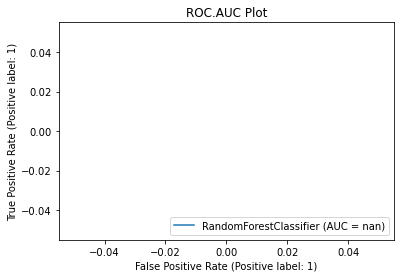

In [235]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(gd_sr.best_estimator_,x_test,y_test)
plt.title("ROC.AUC Plot")
plt.show()

In [236]:
import joblib
joblib.dump(gd_sr.best_estimator_,"RedWine model.pkl")

['RedWine model.pkl']